In [1]:
# Install and import
!pip install -q folium

import pandas as pd
import numpy as np
import io, os
from google.colab import files
import matplotlib.pyplot as plt
%matplotlib inline

import folium
from folium.plugins import HeatMap, MarkerCluster
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler

print("Libraries loaded.")


Libraries loaded.


In [2]:
# Upload file or mount drive then point to file_path
uploaded = files.upload()
file_name = list(uploaded.keys())[0]

try:
    df = pd.read_csv(io.BytesIO(uploaded[file_name]), engine='python', on_bad_lines='skip')
    print("Loaded as CSV")
except Exception as e:
    print("CSV failed:", e, "Trying excel...")
    df = pd.read_excel(io.BytesIO(uploaded[file_name]))
    print("Loaded as Excel")

print("Shape:", df.shape)
display(df.head())


Saving Dataset  (2).csv to Dataset  (2).csv
CSV failed: 'utf-8' codec can't decode byte 0xe3 in position 14: invalid continuation byte Trying excel...
Loaded as Excel
Shape: (9551, 21)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [3]:
# ensure lat/lon numeric and drop invalid rows
lat_col = 'Latitude'
lon_col = 'Longitude'

# Convert to numeric and coerce errors to NaN
df[lat_col] = pd.to_numeric(df[lat_col], errors='coerce')
df[lon_col] = pd.to_numeric(df[lon_col], errors='coerce')

# Drop rows with missing coords
df_geo = df.dropna(subset=[lat_col, lon_col]).copy()
print("Rows with valid coords:", df_geo.shape[0], "of", df.shape[0])

# Remove obvious outliers: lat range [-90,90], lon range [-180,180]
df_geo = df_geo[(df_geo[lat_col].between(-90,90)) & (df_geo[lon_col].between(-180,180))]
print("After removing extreme outliers:", df_geo.shape[0])

# Quick look at coordinate distribution
df_geo[[lat_col, lon_col]].describe()


Rows with valid coords: 9551 of 9551
After removing extreme outliers: 9551


,Latitude,Longitude
count,9551.000000,9551.000000
mean,25.854381,64.126574
std,11.007935,41.467058
min,-41.330428,-157.948486
25%,28.478713,77.081343
50%,28.570469,77.191964
75%,28.642758,77.282006
max,55.976980,174.832089


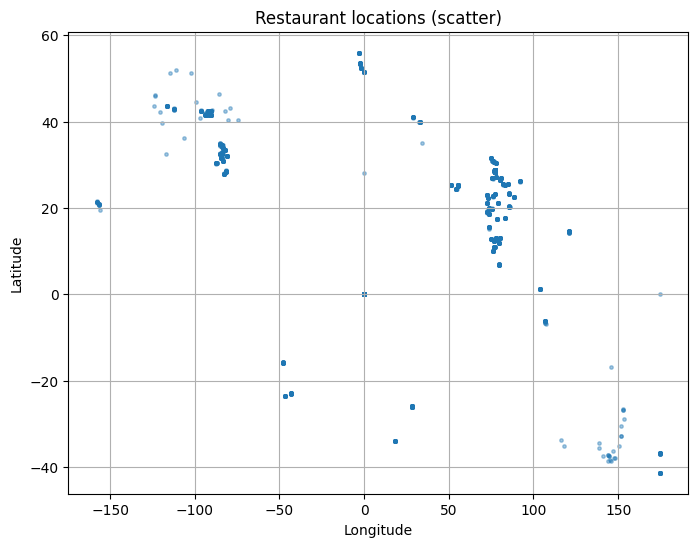

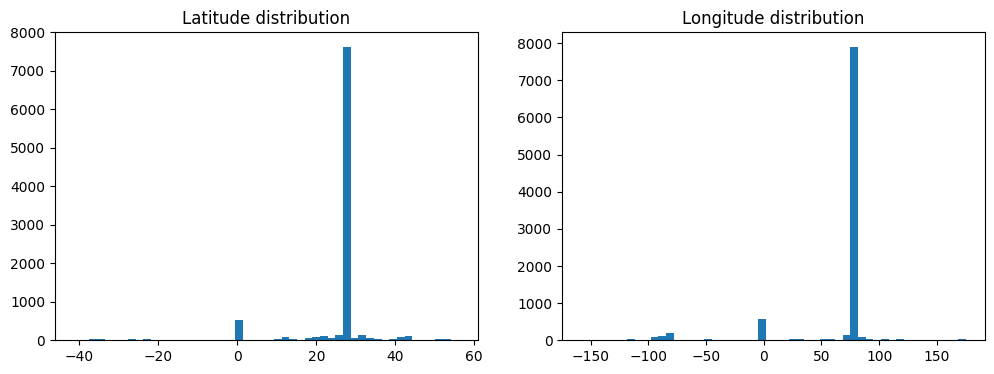

In [4]:
#Scatter and histograms of coordinates
plt.figure(figsize=(8,6))
plt.scatter(df_geo[lon_col], df_geo[lat_col], s=6, alpha=0.4)
plt.xlabel("Longitude"); plt.ylabel("Latitude"); plt.title("Restaurant locations (scatter)")
plt.grid(True)
plt.show()

# Histograms
fig, axs = plt.subplots(1,2, figsize=(12,4))
axs[0].hist(df_geo[lat_col], bins=50); axs[0].set_title("Latitude distribution")
axs[1].hist(df_geo[lon_col], bins=50); axs[1].set_title("Longitude distribution")
plt.show()


In [8]:
# Create interactive folium map with cluster markers
center_lat, center_lon = df_geo[lat_col].median(), df_geo[lon_col].median()
m = folium.Map(location=[center_lat, center_lon], zoom_start=11)


sample_size = min(1500, len(df_geo))
sample = df_geo.sample(sample_size, random_state=42)

marker_cluster = MarkerCluster().add_to(m)
for _, row in sample.iterrows():
    popup_text = f"{row.get('Restaurant Name','')}<br>Rating: {row.get('Aggregate rating','NA')}<br>Cuisines: {row.get('Cuisines','')}"
    folium.Marker([row[lat_col], row[lon_col]], popup=popup_text).add_to(marker_cluster)


m.save("/content/restaurant_cluster_map.html")
m



In [9]:
#  Heatmap  — use sample or all
heat_data = df_geo[[lat_col, lon_col]].values.tolist()
m2 = folium.Map(location=[center_lat, center_lon], zoom_start=11)
HeatMap(heat_data, radius=10, blur=12, min_opacity=0.2).add_to(m2)
m2.save("/content/restaurant_heatmap.html")
m2


In [10]:
# group by City and by Locality (change column names if different)
city_col = 'City'
locality_col = 'Locality'
# Count restaurants per city
if city_col in df_geo.columns:
    city_counts = df_geo[city_col].value_counts().rename_axis('city').reset_index(name='count')
    display(city_counts.head(20))
else:
    print("City column not found.")
# Count restaurants per locality
if locality_col in df_geo.columns:
    loc_counts = df_geo[locality_col].value_counts().rename_axis('locality').reset_index(name='count')
    display(loc_counts.head(20))
else:
    print("Locality column not found.")


,city,count
0,New Delhi,5473
1,Gurgaon,1118
2,Noida,1080
3,Faridabad,251
4,Ghaziabad,25
5,Bhubaneshwar,21
6,Lucknow,21
7,Ahmedabad,21
8,Amritsar,21
9,Guwahati,21


,locality,count
0,Connaught Place,122
1,Rajouri Garden,99
2,Shahdara,87
3,Defence Colony,86
4,Malviya Nagar,85
5,Pitampura,85
6,Mayur Vihar Phase 1,84
7,Rajinder Nagar,81
8,Safdarjung,80
9,Satyaniketan,79


In [11]:
#compute average rating, average cost, price range by city/locality
agg_cols = []

#Make sure columns exist
if 'Aggregate rating' in df_geo.columns:
    agg_cols.append(('Aggregate rating', 'mean'))

if 'Average Cost for two' in df_geo.columns:
    agg_cols.append(('Average Cost for two', 'mean'))

if 'Price range' in df_geo.columns:
    agg_cols.append(('Price range', 'mean'))

#Group by city
if city_col in df_geo.columns and agg_cols:
    city_stats = df_geo.groupby(city_col).agg({c:func for c,func in agg_cols})
    city_stats = city_stats.rename(columns={c:f"{c}_{func}" for c,func in agg_cols})
    city_stats = city_stats.sort_values(by=[f"Aggregate rating_mean"], ascending=False).reset_index()
    display(city_stats.head(20))
else:
    print("City stats not computed - check column names or presence of aggregate columns.")


,City,Aggregate rating_mean,Average Cost for two_mean,Price range_mean
0,Inner City,4.900000,1120.000000,4.00
1,Quezon City,4.800000,800.000000,3.00
2,Makati City,4.650000,1150.000000,3.00
3,Pasig City,4.633333,933.333333,3.00
4,Mandaluyong City,4.625000,2000.000000,3.75
5,Beechworth,4.600000,20.000000,2.00
6,London,4.535000,64.500000,3.00
7,Taguig City,4.525000,1725.000000,3.50
8,Secunderabad,4.500000,825.000000,2.00
9,Lincoln,4.500000,25.000000,2.00


In [12]:
# Top cuisines per city (works best if 'Cuisines' string exists)
if 'Cuisines' in df_geo.columns and city_col in df_geo.columns:

    df_geo['Cuisines_norm'] = df_geo['Cuisines'].fillna('').astype(str).str.replace(';',' ,').str.replace('|',',')
    df_geo['cuis_list'] = df_geo['Cuisines_norm'].apply(lambda s: [x.strip().lower() for x in s.split(',') if x.strip()!=''])

    cuis_exploded = df_geo.explode('cuis_list')
    # count top cuisines per city
    top_k = 5
    city_top_cuis = (cuis_exploded.groupby([city_col, 'cuis_list'])
                     .size().reset_index(name='count')
                     .sort_values([city_col, 'count'], ascending=[True, False]))
    # show top cuisines for top 10 cities by restaurant count
    top_cities = df_geo[city_col].value_counts().nlargest(10).index.tolist()
    for c in top_cities:
        print(f"\nCity: {c} — Top cuisines:")
        display(city_top_cuis[city_top_cuis[city_col]==c].head(top_k))
else:
    print("Cuisines or City column missing.")



City: New Delhi — Top cuisines:


,City,cuis_list,count
1217,New Delhi,north indian,2425
1178,New Delhi,chinese,1638
1185,New Delhi,fast food,1304
1213,New Delhi,mughlai,628
1168,New Delhi,bakery,465



City: Gurgaon — Top cuisines:


,City,cuis_list,count
753,Gurgaon,north indian,508
721,Gurgaon,chinese,324
726,Gurgaon,fast food,220
750,Gurgaon,mughlai,117
710,Gurgaon,bakery,110



City: Noida — Top cuisines:


,City,cuis_list,count
1274,Noida,north indian,532
1251,Noida,chinese,384
1255,Noida,fast food,265
1273,Noida,mughlai,156
1244,Noida,bakery,93



City: Faridabad — Top cuisines:


,City,cuis_list,count
646,Faridabad,north indian,122
632,Faridabad,chinese,96
635,Faridabad,fast food,69
645,Faridabad,mughlai,30
627,Faridabad,bakery,27



City: Ghaziabad — Top cuisines:


,City,cuis_list,count
687,Ghaziabad,north indian,10
683,Ghaziabad,fast food,8
680,Ghaziabad,chinese,6
679,Ghaziabad,cafe,4
678,Ghaziabad,burger,3



City: Bhubaneshwar — Top cuisines:


,City,cuis_list,count
243,Bhubaneshwar,chinese,12
251,Bhubaneshwar,north indian,10
241,Bhubaneshwar,cafe,8
244,Bhubaneshwar,continental,4
238,Bhubaneshwar,asian,3



City: Lucknow — Top cuisines:


,City,cuis_list,count
979,Lucknow,cafe,8
991,Lucknow,north indian,8
981,Lucknow,continental,7
980,Lucknow,chinese,6
986,Lucknow,italian,5



City: Ahmedabad — Top cuisines:


,City,cuis_list,count
48,Ahmedabad,continental,12
53,Ahmedabad,italian,10
56,Ahmedabad,north indian,9
49,Ahmedabad,desserts,6
46,Ahmedabad,cafe,5



City: Amritsar — Top cuisines:


,City,cuis_list,count
104,Amritsar,north indian,15
100,Amritsar,fast food,6
99,Amritsar,chinese,4
103,Amritsar,mughlai,2
106,Amritsar,street food,2



City: Guwahati — Top cuisines:


,City,cuis_list,count
779,Guwahati,chinese,11
780,Guwahati,continental,10
777,Guwahati,cafe,8
788,Guwahati,north indian,6
784,Guwahati,italian,5


In [13]:
#  clustering to find hotspots
coords = df_geo[[lat_col, lon_col]].values

scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

# DBSCAN — finds irregular clusters; eps needs tuning
db = DBSCAN(eps=0.08, min_samples=15).fit(coords_scaled)
df_geo['db_cluster'] = db.labels_

# KMeans — specify number of clusters
k = 8
km = KMeans(n_clusters=k, random_state=42).fit(coords_scaled)
df_geo['kmeans_cluster'] = km.labels_

# show cluster counts
print("DBSCAN cluster counts:")
display(df_geo['db_cluster'].value_counts().head(20))
print("\nKMeans cluster counts:")
display(df_geo['kmeans_cluster'].value_counts().head(20))

# Map KMeans cluster centers
centers = scaler.inverse_transform(km.cluster_centers_)
m3 = folium.Map(location=[center_lat, center_lon], zoom_start=11)
colors = ['red','blue','green','purple','orange','darkred','cadetblue','lightgreen','pink','lightblue']
for _, row in df_geo.iterrows():
    folium.CircleMarker([row[lat_col], row[lon_col]],
                        radius=3,
                        color=colors[int(row['kmeans_cluster']) % len(colors)],
                        fill=True, fill_opacity=0.6).add_to(m3)
for i, c in enumerate(centers):
    folium.CircleMarker([c[0], c[1]], radius=8, color='black', fill=True, fill_color='black').add_to(m3)
m3.save("/content/kmeans_clusters_map.html")
m3


DBSCAN cluster counts:


,count
db_cluster,
22,7549
14,497
4,180
6,121
18,70
19,70
13,69
17,68
15,65



KMeans cluster counts:


,count
kmeans_cluster,
0,7929
1,497
2,438
6,349
7,120
5,114
3,62
4,42


In [15]:
# Aggregate by cluster — example avg rating and top cuisines in cluster
if 'Aggregate rating' in df_geo.columns:
    cluster_stats = df_geo.groupby('kmeans_cluster').agg({
        'Aggregate rating': ['mean', 'count']
    }).reset_index()
    cluster_stats.columns = ['kmeans_cluster', 'avg_rating', 'count']
    display(cluster_stats.sort_values('avg_rating', ascending=False))

# Fix: Ensure 'kmeans_cluster' is in cuis_exploded
if 'kmeans_cluster' not in cuis_exploded.columns:
    cuis_exploded = cuis_exploded.merge(df_geo[['Restaurant ID', 'kmeans_cluster']], on='Restaurant ID', how='left')

# Top cuisines in a cluster
cluster_id = 0
top_k = 10
top_cuis_cluster = (cuis_exploded[cuis_exploded['kmeans_cluster']==cluster_id]
                    .groupby('cuis_list').size().reset_index(name='count').sort_values('count', ascending=False).head(top_k))
print(f"Top cuisines in cluster {cluster_id}:")
display(top_cuis_cluster)

,kmeans_cluster,avg_rating,count
5,5,4.150877,114
3,3,4.030645,62
6,6,4.027507,349
2,2,4.000457,438
7,7,3.986667,120
4,4,3.969048,42
0,0,2.546904,7929
1,1,1.501207,497


Top cuisines in cluster 0:


,cuis_list,count
62,north indian,3583
21,chinese,2454
27,fast food,1859
58,mughlai,925
9,bakery,652
22,continental,606
41,italian,583
75,south indian,574
18,cafe,533
79,street food,529


In [16]:
# save tables and maps for report
city_counts.to_csv('/content/city_counts.csv', index=False) if 'city_counts' in globals() else None
loc_counts.to_csv('/content/locality_counts.csv', index=False) if 'loc_counts' in globals() else None
city_stats.to_csv('/content/city_stats.csv', index=False) if 'city_stats' in globals() else None
df_geo.to_csv('/content/geo_dataset_with_clusters.csv', index=False)
print("Saved CSVs and maps to /content/ (download via Colab Files panel)")


Saved CSVs and maps to /content/ (download via Colab Files panel)
